<a href="https://colab.research.google.com/github/2020130816KimSemin/class2021Spring/blob/main/W2_0908.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Import libraries

import IPython.display as ipd
import librosa
import matplotlib.pyplot as plt
import numpy as np
import os
import plotly.graph_objs as go

In [ ]:
# Load audio

wavUrl = "https://raw.githubusercontent.com/ynebin/class2023Fall/main/aeiou.wav"
os.system("curl " + wavUrl + " > aeiou.wav")

audio, sr = librosa.load("aeiou.wav")
ipd.Audio(audio, rate=sr)

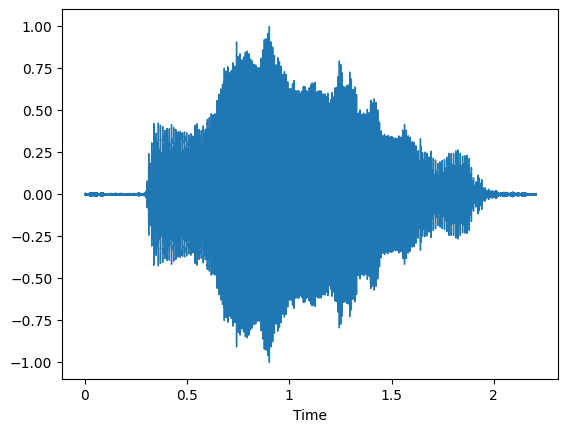

In [ ]:
# Plot audio waveform

audio = librosa.util.normalize(audio)
librosa.display.waveshow(audio, sr=sr)

In [ ]:
# Extract spectrogram

audio = librosa.effects.preemphasis(audio)

n_fft = 512
hop_length = int(0.001 * sr)
win_length = int(0.008 * sr)

spectrogram = librosa.stft(audio, n_fft=n_fft, hop_length=hop_length, win_length=win_length)
spectrogram = np.abs(spectrogram)
spectrogram = librosa.amplitude_to_db(spectrogram, ref=np.max)

(0.0, 5000.0)

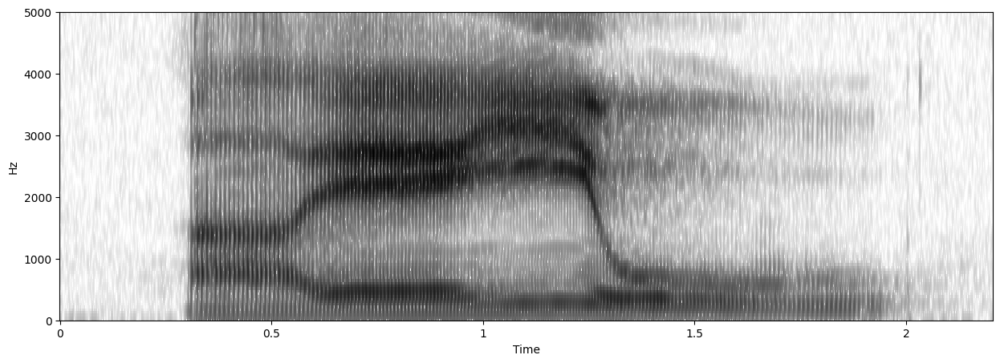

In [ ]:
# Plot spectrogram (2D)

plt.figure(figsize=(15, 5))
xTicks = np.linspace(1, audio.shape[0], spectrogram.shape[1]) / sr
librosa.display.specshow(spectrogram, sr=sr, x_coords=xTicks, x_axis="time", y_axis="linear", cmap="Greys")
plt.ylim((0, 5000))

In [ ]:
# Plot spectrogram (3D)
freq = librosa.core.fft_frequencies(sr=sr, n_fft=2 * spectrogram.shape[0])[:-1]

fig = go.Figure(data=[go.Surface(x=xTicks, y=freq, z=spectrogram, colorscale="gray", reversescale=True)])
fig.update_layout(
    title='3D Spectrogram',
    scene=dict(
        xaxis_title='Time',
        yaxis_title='Frequency',
        zaxis_title='Amplitude',
        yaxis=dict(
            range=[freq.min(), 5000]
        )
    ),
)
fig.show()